In [7]:
from app.modelo.imagem_rgb import ImagemRGB

In [8]:
imagem_rgb = ImagemRGB.from_file('imageTest.jpg')

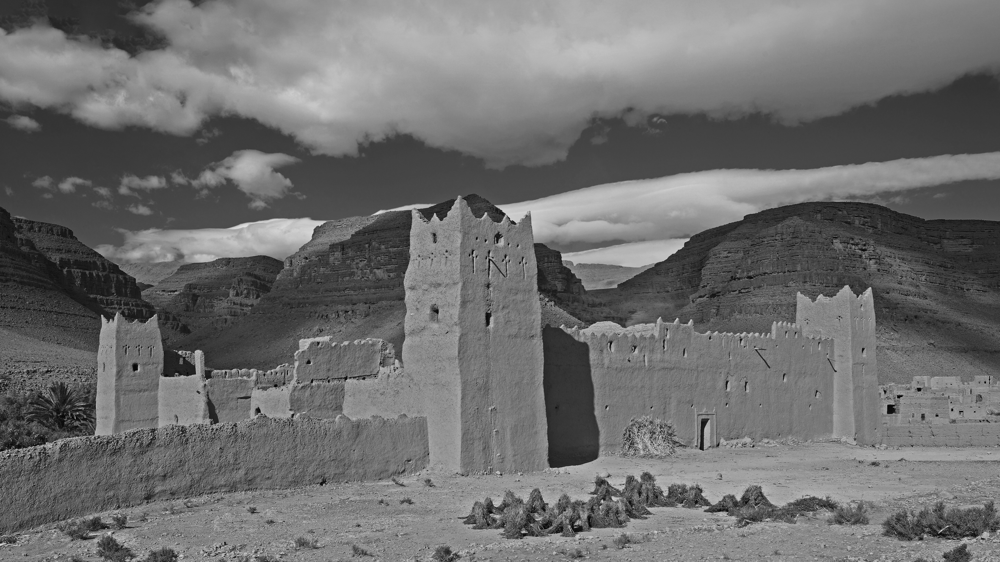

In [9]:
imagem_rgb.to_image().convert('L')

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [5]:
# Função para quantizar a imagem em 16 tons de cinza
def quantize_image(image, levels=16):
    return (image * (levels - 1) / 255).astype(np.uint8)

In [13]:
# Função para calcular a matriz de co-ocorrência manualmente
def calculate_coocurrence_matrix(image, distance, levels=16):
    max_gray = levels - 1
    cooc_matrix = np.zeros((levels, levels), dtype=int)

    for i in range(image.shape[0] - distance):
        for j in range(image.shape[1] - distance):
            row_value = image[i, j]
            col_value = image[i + distance, j + distance]
            cooc_matrix[row_value, col_value] += 1

    return cooc_matrix

In [8]:
# Carregar a imagem e converter para tons de cinza
image = Image.open('imageTest.jpg').convert('L')
gray_image = np.array(image)

In [9]:
# Quantizar a imagem em 16 tons de cinza
quantized_image = quantize_image(gray_image, levels=16)

In [10]:
# Distâncias para as matrizes de co-ocorrência
distances = [1, 2, 4, 8, 16, 32]

In [14]:
# Calcular as matrizes de co-ocorrência para cada distância
glcm_matrices = {d: calculate_coocurrence_matrix(quantized_image, d) for d in distances}

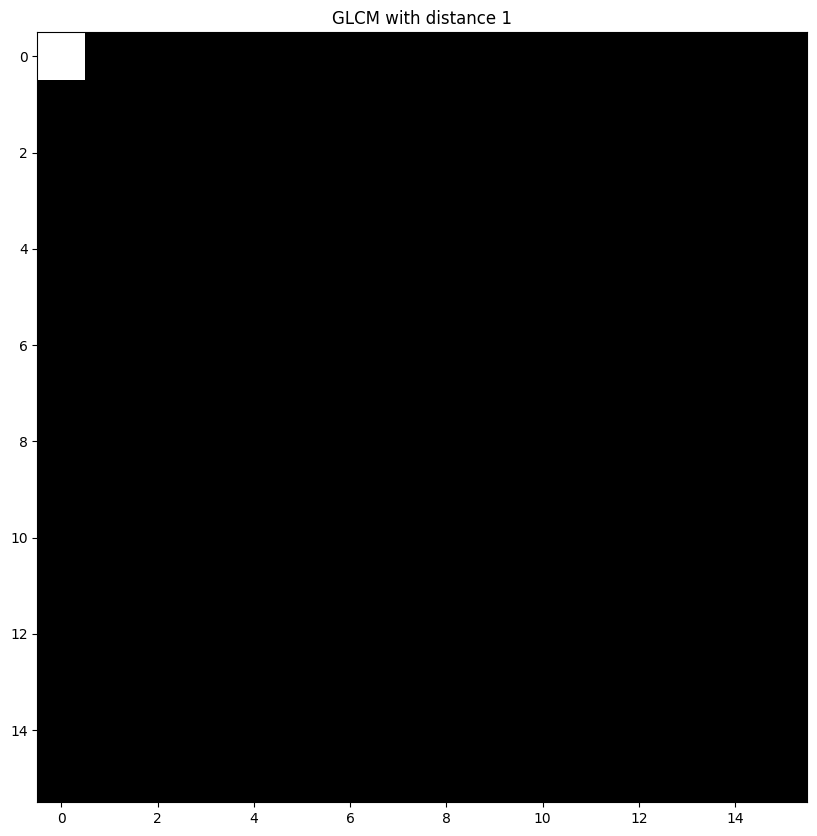

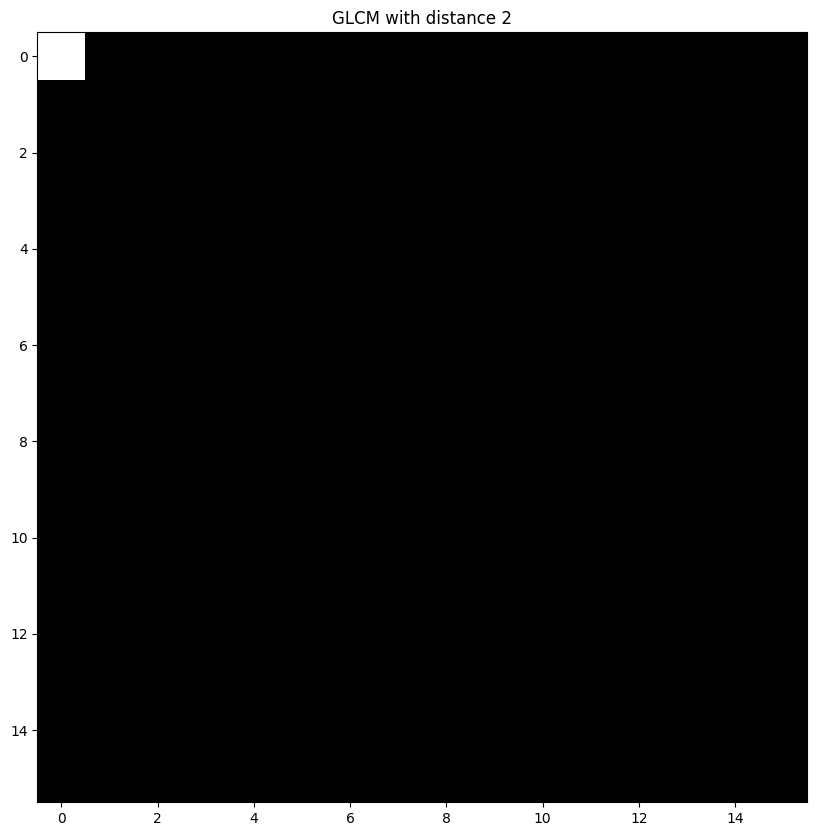

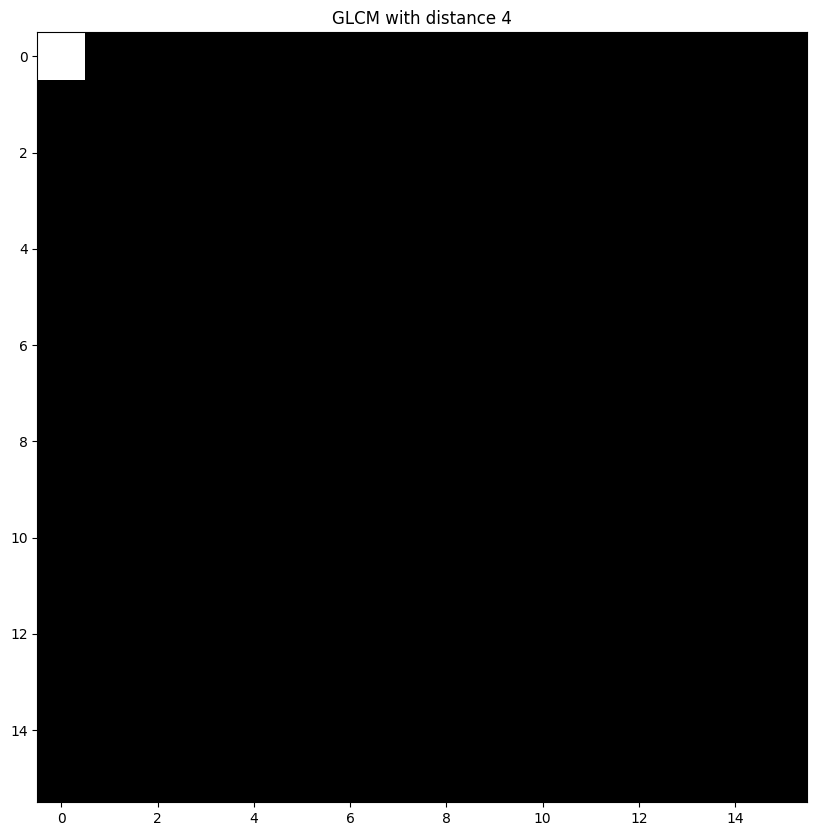

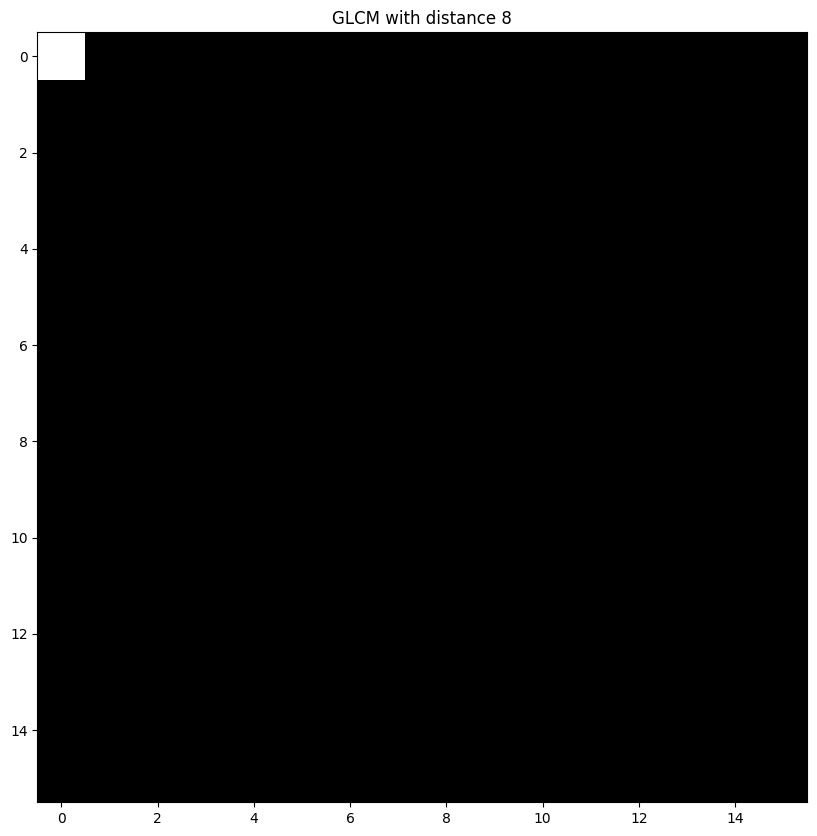

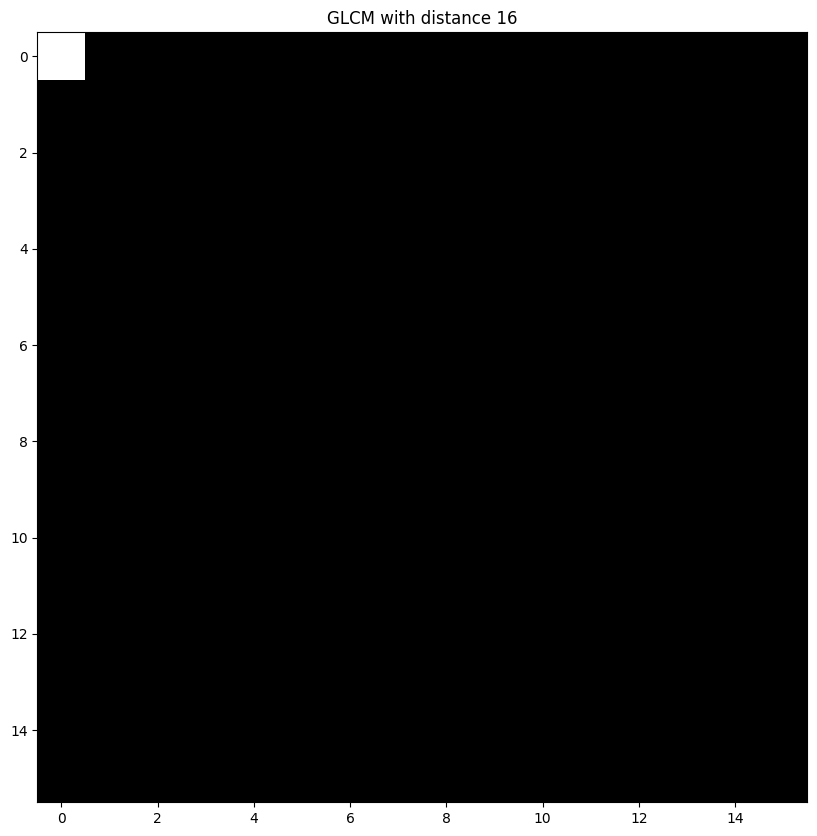

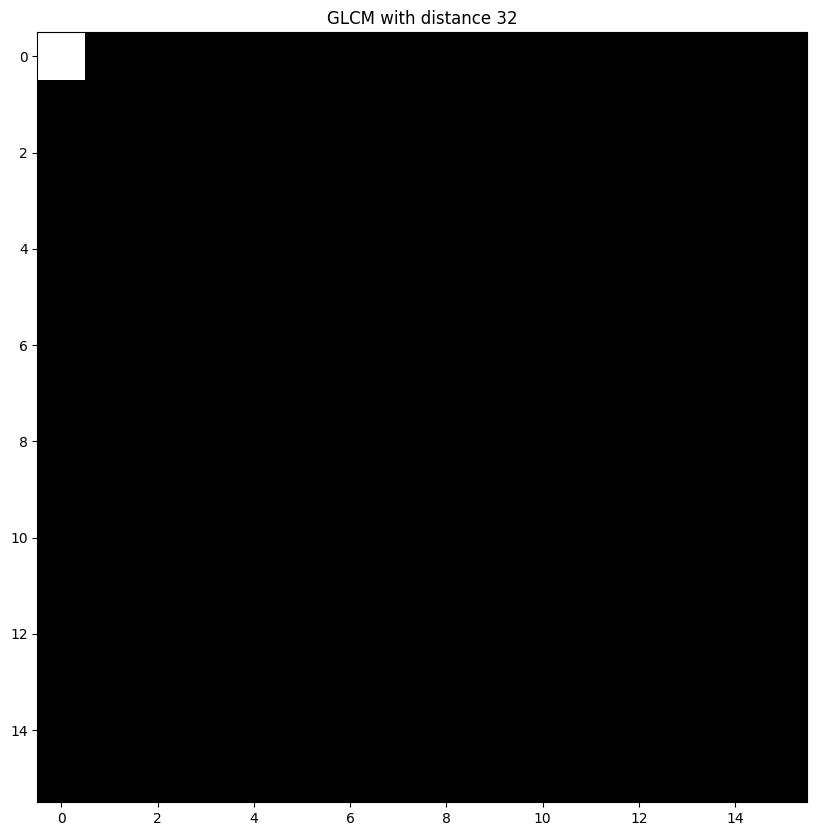

In [15]:
# Exibir as matrizes de co-ocorrência
for d, glcm in glcm_matrices.items():
    plt.figure(figsize=(10, 10))
    plt.imshow(glcm, cmap='gray')
    plt.title(f'GLCM with distance {d}')
    plt.show()